In [1]:
import pandas as pd
import numpy as np
import joblib
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from xgboost import XGBRegressor 
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import RandomForestRegressor

In [2]:
# Load your preprocessed dataset
df = pd.read_csv('./Preprocessed/preprocessed_air_quality_data.csv')

# Drop non-numeric and target columns from features
target_col = 'PM10_MAX'
drop_cols = [target_col, 'NAME', 'LASTUPDATEDATETIME', 'timestamp']
drop_cols = [col for col in drop_cols if col in df.columns]
features = df.drop(columns=drop_cols)
target = df[target_col]

print(f"Features shape: {features.shape}")
print(f"Target shape: {target.shape}")
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

Features shape: (103205, 23)
Target shape: (103205,)


In [3]:
class ANN(nn.Module):
    def __init__(self, input_dim):
        super(ANN, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(input_dim, 64),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Dropout(0.3),
            nn.Linear(32, 1)
        )
    def forward(self, x):
        return self.layers(x)

In [4]:
ann_model = ANN(input_dim=X_train.shape[1])
ann_model.load_state_dict(torch.load('models/ann_model.pth'))

xgb_model = joblib.load('models/xgb_regressor.pkl')

scaler = joblib.load('models/ann_scaler.pkl')

In [5]:
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [6]:
with torch.no_grad():
        inputs = torch.tensor(X_train_scaled, dtype=torch.float32)
        predictions = ann_model(inputs).numpy().flatten()  
        
xgb_preds = xgb_model.predict(X_train_scaled)

In [7]:
meta_features = np.column_stack((xgb_preds, predictions))

In [8]:
gb_meta_model = GradientBoostingRegressor(n_estimators=100, learning_rate=0.05, max_depth=3)
gb_meta_model.fit(meta_features, y_train)


GradientBoostingRegressor(learning_rate=0.05)

In [9]:
gb_meta_preds = gb_meta_model.predict(meta_features)
gb_meta_train_rmse = np.sqrt(mean_squared_error(y_train, gb_meta_preds))
gb_meta_train_mae = mean_absolute_error(y_train, gb_meta_preds)
gb_meta_train_r2 = r2_score(y_train, gb_meta_preds)

print(f"✅ Meta-Model Performance:")
print(f"📉 RMSE: {gb_meta_train_rmse:.2f}")
print(f"📉 MAE: {gb_meta_train_mae:.2f}")
print(f"📈 R² Score: {gb_meta_train_r2:.4f}")

✅ Meta-Model Performance:
📉 RMSE: 0.00
📉 MAE: 0.00
📈 R² Score: 0.9999


In [22]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import torch

# Convert to PyTorch tensors
X_scaled = scaler.fit_transform(features)
y_np = target.values.reshape(-1, 1)
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y_np, dtype=torch.float32)

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

# Store metrics for evaluation
mae_scores_gb_meta, rmse_scores_gb_meta, r2_scores_gb_meta = [], [], []

# Perform TSCV loop
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_tensor)):
    print(f"\nFold {fold+1}")
    
    # Split data for current fold
    X_train_fold, X_test_fold = X_tensor[train_idx], X_tensor[test_idx]
    y_train_fold, y_test_fold = y_tensor[train_idx], y_tensor[test_idx]
    
    # XGBoost Model Training
    xgb_model.fit(X_train_fold.numpy(), y_train_fold.numpy())
    
    # ANN Model Training
    ann_model = ANN(input_dim=X_train_fold.shape[1])
    criterion = nn.MSELoss()
    optimizer = optim.Adam(ann_model.parameters(), lr=0.001)
    
    ann_model.train()
    for epoch in range(100):  # Train for 100 epochs (adjust as needed)
        optimizer.zero_grad()
        output = ann_model(X_train_fold)
        loss = criterion(output, y_train_fold)
        loss.backward()
        optimizer.step()

    # Get Predictions from XGBoost and ANN
    with torch.no_grad():
        ann_preds = ann_model(X_train_fold).numpy().flatten()
    
    xgb_preds = xgb_model.predict(X_train_fold.numpy())
    
    # Stack predictions as meta-features
    meta_features = np.column_stack((xgb_preds, ann_preds))
    
    # Train the Gradient Boosting Regressor (Meta-model)
    gb_meta_model.fit(meta_features, y_train_fold.numpy())
    
    # Predict with the stacked model on the test fold
    with torch.no_grad():
        ann_test_preds = ann_model(X_test_fold).numpy().flatten()
    
    xgb_test_preds = xgb_model.predict(X_test_fold.numpy())
    
    # Stack the predictions
    meta_features_test = np.column_stack((xgb_test_preds, ann_test_preds))
    
    # Meta-model prediction (GBR)
    y_pred_test = gb_meta_model.predict(meta_features_test)
    
    # Evaluate
    y_true = y_test_fold.numpy().flatten()
    mae = mean_absolute_error(y_true, y_pred_test)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred_test))
    r2 = r2_score(y_true, y_pred_test)
    
    mae_scores_gb_meta.append(mae)
    rmse_scores_gb_meta.append(rmse)
    r2_scores_gb_meta.append(r2)
    
    print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

# Final averaged results across all folds
print("\n🔁 TSCV XGB Stacked Model Evaluation (avg across folds):")
print(f"Mean MAE: {np.mean(mae_scores_gb_meta):.4f} ± {np.std(mae_scores_gb_meta):.4f}")
print(f"Mean RMSE: {np.mean(rmse_scores_gb_meta):.4f} ± {np.std(rmse_scores_gb_meta):.4f}")
print(f"Mean R²: {np.mean(r2_scores_gb_meta):.4f} ± {np.std(r2_scores_gb_meta):.4f}")


Fold 1


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


MAE: 0.0255, RMSE: 0.0366, R²: 0.9664

Fold 2


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


MAE: 0.0321, RMSE: 0.0464, R²: 0.9239

Fold 3


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


MAE: 0.0316, RMSE: 0.0542, R²: 0.9134

Fold 4


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


MAE: 0.0431, RMSE: 0.0827, R²: 0.8496

Fold 5


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\ensemble\_gb.py:672: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)  # TODO: Is this still required?


MAE: 0.0191, RMSE: 0.0294, R²: 0.9840

🔁 TSCV XGB Stacked Model Evaluation (avg across folds):
Mean MAE: 0.0303 ± 0.0080
Mean RMSE: 0.0499 ± 0.0185
Mean R²: 0.9275 ± 0.0469


In [11]:
with torch.no_grad():
        inputs = torch.tensor(X_train_scaled, dtype=torch.float32)
        predictions = ann_model(inputs).numpy().flatten()  
        
xgb_preds = xgb_model.predict(X_train_scaled)

In [12]:
meta_features = np.column_stack((xgb_preds, predictions))

In [13]:
# Initialize and train the Random Forest meta-model
rf_meta_model = RandomForestRegressor(
    n_estimators=100,       
    random_state=42,
)

rf_meta_model.fit(meta_features, y_train)




RandomForestRegressor(random_state=42)

In [14]:
# Predict using the meta-model
rf_meta_preds = rf_meta_model.predict(meta_features)

# Evaluate performance
rf_meta_train_rmse = np.sqrt(mean_squared_error(y_train, rf_meta_preds))
rf_meta_train_mae = mean_absolute_error(y_train, rf_meta_preds)
rf_meta_train_r2 = r2_score(y_train, rf_meta_preds)

print(f"🌲 Random Forest Meta-Model Performance:")
print(f"📉 RMSE: {rf_meta_train_rmse:.2f}")
print(f"📉 MAE: {rf_meta_train_mae:.2f}")
print(f"📈 R² Score: {rf_meta_train_r2:.4f}")

🌲 Random Forest Meta-Model Performance:
📉 RMSE: 0.01
📉 MAE: 0.00
📈 R² Score: 0.9993


In [21]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import torch

# Convert to PyTorch tensors
X_scaled = scaler.fit_transform(features)
y_np = target.values.reshape(-1, 1)
X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y_np, dtype=torch.float32)

# Define TimeSeriesSplit
tscv = TimeSeriesSplit(n_splits=5)

# Store metrics for evaluation
mae_scores_rf_meta, rmse_scores_rf_meta, r2_scores_rf_meta = [], [], []

# Perform TSCV loop
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_tensor)):
    print(f"\nFold {fold+1}")
    
    # Split data for current fold
    X_train_fold, X_test_fold = X_tensor[train_idx], X_tensor[test_idx]
    y_train_fold, y_test_fold = y_tensor[train_idx], y_tensor[test_idx]
    
    # XGBoost Model Training
    xgb_model.fit(X_train_fold.numpy(), y_train_fold.numpy())
    
    # ANN Model Training
    ann_model = ANN(input_dim=X_train_fold.shape[1])
    criterion = nn.MSELoss()
    optimizer = optim.Adam(ann_model.parameters(), lr=0.001)
    
    ann_model.train()
    for epoch in range(100):  # Train for 100 epochs (adjust as needed)
        optimizer.zero_grad()
        output = ann_model(X_train_fold)
        loss = criterion(output, y_train_fold)
        loss.backward()
        optimizer.step()

    # Get Predictions from XGBoost and ANN
    with torch.no_grad():
        ann_preds = ann_model(X_train_fold).numpy().flatten()
    
    xgb_preds = xgb_model.predict(X_train_fold.numpy())
    
    # Stack predictions as meta-features
    meta_features = np.column_stack((xgb_preds, ann_preds))
    
    # Train the Gradient Boosting Regressor (Meta-model)
    rf_meta_model.fit(meta_features, y_train_fold.numpy())
    
    # Predict with the stacked model on the test fold
    with torch.no_grad():
        ann_test_preds = ann_model(X_test_fold).numpy().flatten()
    
    xgb_test_preds = xgb_model.predict(X_test_fold.numpy())
    
    # Stack the predictions
    meta_features_test = np.column_stack((xgb_test_preds, ann_test_preds))
    
    # Meta-model prediction (GBR)
    y_pred_test = rf_meta_model.predict(meta_features_test)
    
    # Evaluate
    y_true = y_test_fold.numpy().flatten()
    mae = mean_absolute_error(y_true, y_pred_test)
    rmse = np.sqrt(mean_squared_error(y_true, y_pred_test))
    r2 = r2_score(y_true, y_pred_test)
    
    mae_scores_rf_meta.append(mae)
    rmse_scores_rf_meta.append(rmse)
    r2_scores_rf_meta.append(r2)
    
    print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

# Final averaged results across all folds
print("\n🔁 TSCV Stacked Model Evaluation (avg across folds):")
print(f"Mean MAE: {np.mean(mae_scores_rf_meta):.4f} ± {np.std(mae_scores_rf_meta):.4f}")
print(f"Mean RMSE: {np.mean(rmse_scores_rf_meta):.4f} ± {np.std(rmse_scores_rf_meta):.4f}")
print(f"Mean R²: {np.mean(r2_scores_rf_meta):.4f} ± {np.std(r2_scores_rf_meta):.4f}")


Fold 1


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


MAE: 0.0243, RMSE: 0.0353, R²: 0.9688

Fold 2


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


MAE: 0.0316, RMSE: 0.0463, R²: 0.9244

Fold 3


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


MAE: 0.0303, RMSE: 0.0538, R²: 0.9147

Fold 4


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


MAE: 0.0428, RMSE: 0.0826, R²: 0.8500

Fold 5


C:\Users\nitro\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:1389: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return fit_method(estimator, *args, **kwargs)


MAE: 0.0186, RMSE: 0.0294, R²: 0.9840

🔁 TSCV Stacked Model Evaluation (avg across folds):
Mean MAE: 0.0295 ± 0.0081
Mean RMSE: 0.0495 ± 0.0186
Mean R²: 0.9284 ± 0.0471


In [12]:
joblib.dump(rf_meta_model, "models/rf_meta_model.pkl")
joblib.dump(gb_meta_model, "models/gb_meta_model.pkl")

['models/gb_meta_model.pkl']

In [13]:
with torch.no_grad():
        inputs = torch.tensor(X_test_scaled, dtype=torch.float32)
        predictions = ann_model(inputs).numpy().flatten()  # Get predicted values
        
xgb_preds = xgb_model.predict(X_test_scaled)

In [14]:
meta_features_test = np.column_stack((xgb_preds, predictions))

In [15]:
gb_meta_preds = gb_meta_model.predict(meta_features_test)
gb_meta_rmse = np.sqrt(mean_squared_error(y_test, gb_meta_preds))
gb_meta_mae = mean_absolute_error(y_test, gb_meta_preds)
gb_meta_r2 = r2_score(y_test, gb_meta_preds)

print(f"✅ Meta-Model Performance:")
print(f"📉 RMSE: {gb_meta_rmse:.2f}")
print(f"📉 MAE: {gb_meta_mae:.2f}")
print(f"📈 R² Score: {gb_meta_r2:.4f}")

✅ Meta-Model Performance:
📉 RMSE: 0.00
📉 MAE: 0.00
📈 R² Score: 0.9997


In [16]:
rf_meta_preds = rf_meta_model.predict(meta_features_test)
rf_meta_rmse = np.sqrt(mean_squared_error(y_test, rf_meta_preds))
rf_meta_mae = mean_absolute_error(y_test, rf_meta_preds)
rf_meta_r2 = r2_score(y_test, rf_meta_preds)

print(f"🌲 Random Forest Meta-Model Performance:")
print(f"📉 RMSE: {rf_meta_rmse:.2f}")
print(f"📉 MAE: {rf_meta_mae:.2f}")
print(f"📈 R² Score: {rf_meta_r2:.4f}")

🌲 Random Forest Meta-Model Performance:
📉 RMSE: 0.00
📉 MAE: 0.00
📈 R² Score: 0.9997


In [17]:
new_data = features.iloc[:-20]
new_data_scaled = scaler.transform(new_data)

In [18]:
with torch.no_grad():
    ann_preds = ann_model(torch.tensor(new_data_scaled, dtype=torch.float32)).numpy().flatten()

xgb_preds = xgb_model.predict(new_data_scaled)


In [19]:
meta_features_new = np.column_stack((xgb_preds, ann_preds))

In [20]:
final_predictions_rf = rf_meta_model.predict(meta_features_new)

In [21]:
# Show results
true_targets = target.iloc[:-20].values
for i, pred in enumerate(final_predictions_rf):
    print(f"Target: {target[i]}\nRow {i+1} → Predicted PM10_MAX: {pred:.2f}")

Target: 0.5925925925925926
Row 1 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 2 → Predicted PM10_MAX: 0.59
Target: 0.7407407407407407
Row 3 → Predicted PM10_MAX: 0.74
Target: 0.611111111111111
Row 4 → Predicted PM10_MAX: 0.61
Target: 0.5925925925925926
Row 5 → Predicted PM10_MAX: 0.59
Target: 0.5740740740740741
Row 6 → Predicted PM10_MAX: 0.57
Target: 0.537037037037037
Row 7 → Predicted PM10_MAX: 0.54
Target: 0.5925925925925926
Row 8 → Predicted PM10_MAX: 0.59
Target: 0.7407407407407407
Row 9 → Predicted PM10_MAX: 0.74
Target: 0.611111111111111
Row 10 → Predicted PM10_MAX: 0.61
Target: 0.611111111111111
Row 11 → Predicted PM10_MAX: 0.61
Target: 0.5925925925925926
Row 12 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 13 → Predicted PM10_MAX: 0.59
Target: 0.5740740740740741
Row 14 → Predicted PM10_MAX: 0.57
Target: 0.5925925925925926
Row 15 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 16 → Predicted PM10_MAX: 0.59
Target: 0.611111111111111
Row 17 → Pr

In [22]:
final_predictions_gb = gb_meta_model.predict(meta_features_new)

In [23]:
true_targets = target.iloc[:-20].values
for i, pred in enumerate(final_predictions_gb):
    print(f"Target: {target[i]}\nRow {i+1} → Predicted PM10_MAX: {pred:.2f}")

Target: 0.5925925925925926
Row 1 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 2 → Predicted PM10_MAX: 0.59
Target: 0.7407407407407407
Row 3 → Predicted PM10_MAX: 0.74
Target: 0.611111111111111
Row 4 → Predicted PM10_MAX: 0.61
Target: 0.5925925925925926
Row 5 → Predicted PM10_MAX: 0.59
Target: 0.5740740740740741
Row 6 → Predicted PM10_MAX: 0.57
Target: 0.537037037037037
Row 7 → Predicted PM10_MAX: 0.54
Target: 0.5925925925925926
Row 8 → Predicted PM10_MAX: 0.59
Target: 0.7407407407407407
Row 9 → Predicted PM10_MAX: 0.74
Target: 0.611111111111111
Row 10 → Predicted PM10_MAX: 0.61
Target: 0.611111111111111
Row 11 → Predicted PM10_MAX: 0.61
Target: 0.5925925925925926
Row 12 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 13 → Predicted PM10_MAX: 0.59
Target: 0.5740740740740741
Row 14 → Predicted PM10_MAX: 0.57
Target: 0.5925925925925926
Row 15 → Predicted PM10_MAX: 0.59
Target: 0.5925925925925926
Row 16 → Predicted PM10_MAX: 0.59
Target: 0.611111111111111
Row 17 → Pr

C:\Users\nitro\AppData\Local\Temp\ipykernel_6840\3896320245.py:13: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
d:\AQI_project_hybrid\.conda\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


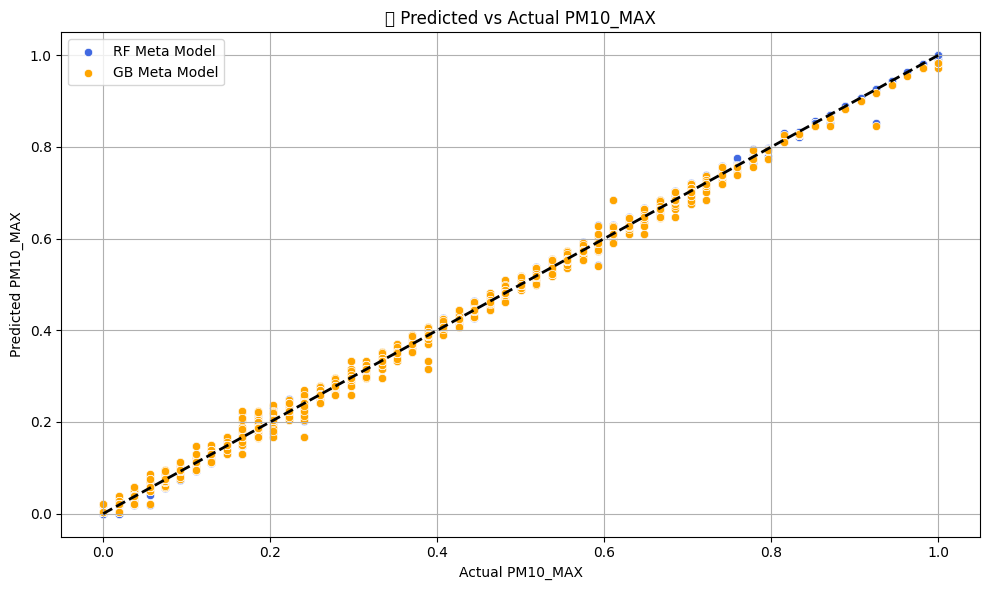

In [24]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x=y_test, y=rf_meta_preds, color="royalblue", label="RF Meta Model")
sns.scatterplot(x=y_test, y=gb_meta_preds, color="orange", label="GB Meta Model")
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2)
plt.xlabel("Actual PM10_MAX")
plt.ylabel("Predicted PM10_MAX")
plt.title("📊 Predicted vs Actual PM10_MAX")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

In [53]:
from tabulate import tabulate

# Step 1: Get meta-model predictions on Train and Validation sets
# Reuse existing meta_features and y_train, y_test

# Train predictions
# gb_train_pred = gb_meta_model.predict(np.column_stack((xgb_model.predict(X_train_scaled),
#                                                        ann_model(torch.tensor(X_train_scaled, dtype=torch.float32)).detach().numpy().flatten())))
# rf_train_pred = rf_meta_model.predict(np.column_stack((xgb_model.predict(X_train_scaled),
#                                                        ann_model(torch.tensor(X_train_scaled, dtype=torch.float32)).detach().numpy().flatten())))

# # Validation/Test predictions
# gb_val_pred = gb_meta_model.predict(np.column_stack((xgb_model.predict(X_test_scaled),
#                                                      ann_model(torch.tensor(X_test_scaled, dtype=torch.float32)).detach().numpy().flatten())))
# rf_val_pred = rf_meta_model.predict(np.column_stack((xgb_model.predict(X_test_scaled),
#                                                      ann_model(torch.tensor(X_test_scaled, dtype=torch.float32)).detach().numpy().flatten())))

# Step 2: Compute metrics
# gb_train_metrics = regression_metrics(y_train, gb_train_pred)
# gb_val_metrics = regression_metrics(y_test, gb_val_pred)

# rf_train_metrics = regression_metrics(y_train, rf_train_pred)
# rf_val_metrics = regression_metrics(y_test, rf_val_pred)

# Step 3: Create and print table
meta_metrics_df = pd.DataFrame({
    'Model': ['GB Validation', 'GB Train', 'RF Validation', 'RF Train'],
    'MAE': [gb_meta_mae, gb_meta_train_mae, rf_meta_mae, rf_meta_train_mae],
    'RMSE': [gb_meta_rmse, gb_meta_train_rmse, rf_meta_rmse, rf_meta_train_rmse],
    'R² Score': [gb_meta_r2, gb_meta_train_r2, rf_meta_r2, rf_meta_train_r2],
})

print("\n📊 Meta-Model Performance Metrics:")
print(tabulate(meta_metrics_df.round(4), headers='keys', tablefmt='pretty'))


📊 Meta-Model Performance Metrics:
+---+---------------+--------+--------+----------+
|   |     Model     |  MAE   |  RMSE  | R² Score |
+---+---------------+--------+--------+----------+
| 0 | GB Validation | 0.0021 | 0.0042 |  0.9997  |
| 1 |   GB Train    | 0.0015 | 0.0024 |  0.9999  |
| 2 | RF Validation | 0.0009 | 0.0039 |  0.9997  |
| 3 |   RF Train    | 0.0001 | 0.0007 |   1.0    |
+---+---------------+--------+--------+----------+


C:\Users\nitro\AppData\Local\Temp\ipykernel_6840\283148014.py:14: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
d:\AQI_project_hybrid\.conda\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128279 (\N{LINK SYMBOL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


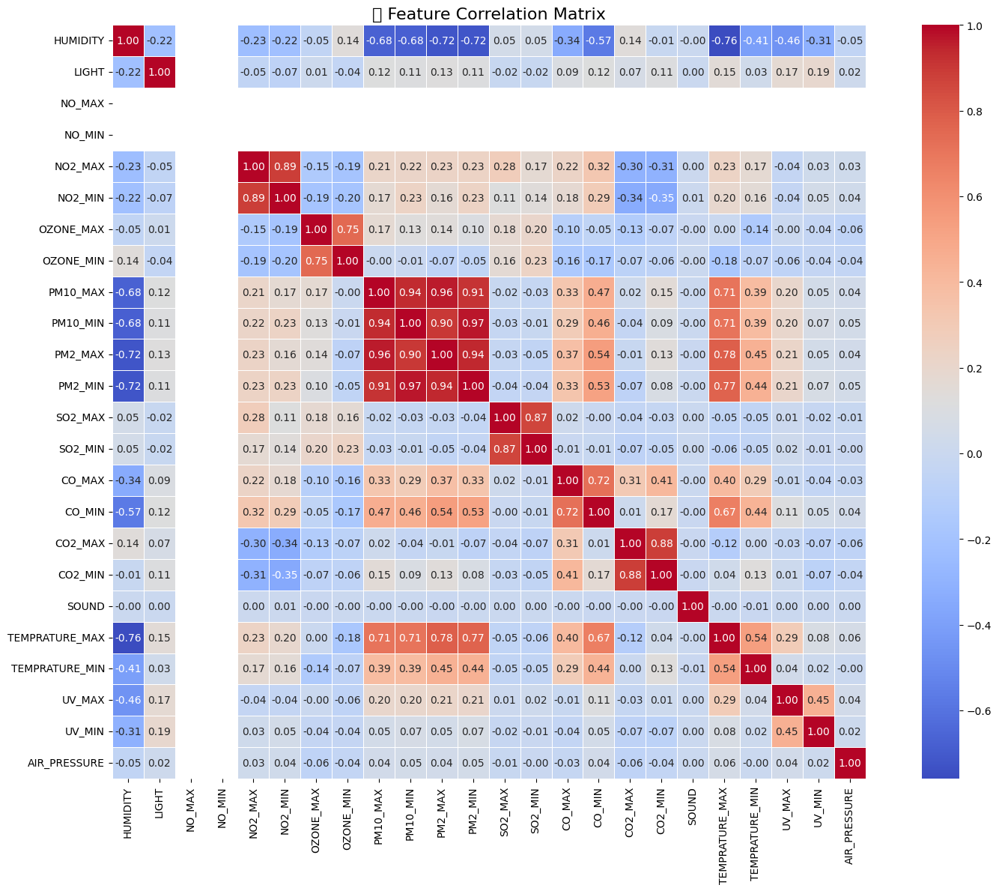

In [25]:
import matplotlib.pyplot as plt
import seaborn as sns

# Compute correlation matrix
corr_matrix = df.corr(numeric_only=True)

# Set up the matplotlib figure
plt.figure(figsize=(16, 12))

# Draw the heatmap
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True, linewidths=0.5)

plt.title("🔗 Feature Correlation Matrix", fontsize=16)
plt.tight_layout()
plt.show()

In [36]:
from sklearn.model_selection import cross_val_score
tscv = TimeSeriesSplit(n_splits=5)
scores_r2_xgb = cross_val_score(xgb_model, features, target, scoring='r2', cv=tscv)
score_mae_xgb = cross_val_score(xgb_model, features, target, scoring='neg_mean_absolute_error', cv=tscv)
score_rmse_xgb = cross_val_score(xgb_model, features, target, scoring='neg_root_mean_squared_error', cv=tscv)

print(f"Mean TimeSeries CV R²: {np.mean(scores_r2_xgb):.4f} ± {np.std(scores_r2_xgb):.4f}")
print(f"Mean TimeSeries CV MAE: {-np.mean(score_mae_xgb):.4f} ± {np.std(score_mae_xgb):.4f}")
print(f"Mean TimeSeries CV RMSE: {-np.mean(score_rmse_xgb):.4f} ± {np.std(score_rmse_xgb):.4f}")

Mean TimeSeries CV R²: 0.9290 ± 0.0471
Mean TimeSeries CV MAE: 0.0301 ± 0.0081
Mean TimeSeries CV RMSE: 0.0492 ± 0.0187


In [ ]:
from sklearn.model_selection import TimeSeriesSplit
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Convert numpy arrays to PyTorch tensors
X_scaled = scaler.fit_transform(features)
y_np = target.values.reshape(-1, 1)

X_tensor = torch.tensor(X_scaled, dtype=torch.float32)
y_tensor = torch.tensor(y_np, dtype=torch.float32)

tscv = TimeSeriesSplit(n_splits=5)

# Store metrics
mae_scores_ann, rmse_scores_ann, r2_scores_ann = [], [], []

# Loop through time series folds
for fold, (train_idx, test_idx) in enumerate(tscv.split(X_tensor)):
    print(f"\nFold {fold+1}")
    X_train_fold, X_test_fold = X_tensor[train_idx], X_tensor[test_idx]
    y_train_fold, y_test_fold = y_tensor[train_idx], y_tensor[test_idx]

    # Model and optimizer
    model = ANN(input_dim=X_tensor.shape[1])
    criterion = nn.MSELoss()
    optimizer = optim.Adam(model.parameters(), lr=0.001)

    # Train the model
    model.train()
    for epoch in range(100):  # Simple fixed epochs
        optimizer.zero_grad()
        output = model(X_train_fold)
        loss = criterion(output, y_train_fold)
        loss.backward()
        optimizer.step()

    # Evaluate
    model.eval()
    with torch.no_grad():
        y_pred = model(X_test_fold).numpy().flatten()
        y_true = y_test_fold.numpy().flatten()

        mae = mean_absolute_error(y_true, y_pred)
        rmse = np.sqrt(mean_squared_error(y_true, y_pred))
        r2 = r2_score(y_true, y_pred)

        mae_scores_ann.append(mae)
        rmse_scores_ann.append(rmse)
        r2_scores_ann.append(r2)

        print(f"MAE: {mae:.4f}, RMSE: {rmse:.4f}, R²: {r2:.4f}")

# Final averaged results
print("\n🔁 TSCV ANN Evaluation (avg across folds):")
print(f"Mean MAE: {np.mean(mae_scores_ann):.4f} ± {np.std(mae_scores):.4f}")
print(f"Mean RMSE: {np.mean(rmse_scores_ann):.4f} ± {np.std(rmse_scores):.4f}")
print(f"Mean R²: {np.mean(r2_scores_ann):.4f} ± {np.std(r2_scores):.4f}")


Fold 1
MAE: 0.0497, RMSE: 0.0623, R²: 0.9029

Fold 2
MAE: 0.0542, RMSE: 0.0761, R²: 0.7954

Fold 3
MAE: 0.0782, RMSE: 0.1136, R²: 0.6199

Fold 4
MAE: 0.0745, RMSE: 0.1254, R²: 0.6546

Fold 5
MAE: 0.0426, RMSE: 0.0589, R²: 0.9356

🔁 TSCV ANN Evaluation (avg across folds):
Mean MAE: 0.0598 ± 0.0130
Mean RMSE: 0.0873 ± 0.0186
Mean R²: 0.7817 ± 0.0822


C:\Users\nitro\AppData\Local\Temp\ipykernel_39244\2777835703.py:50: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
d:\AQI_project_hybrid\.conda\lib\site-packages\IPython\core\pylabtools.py:170: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


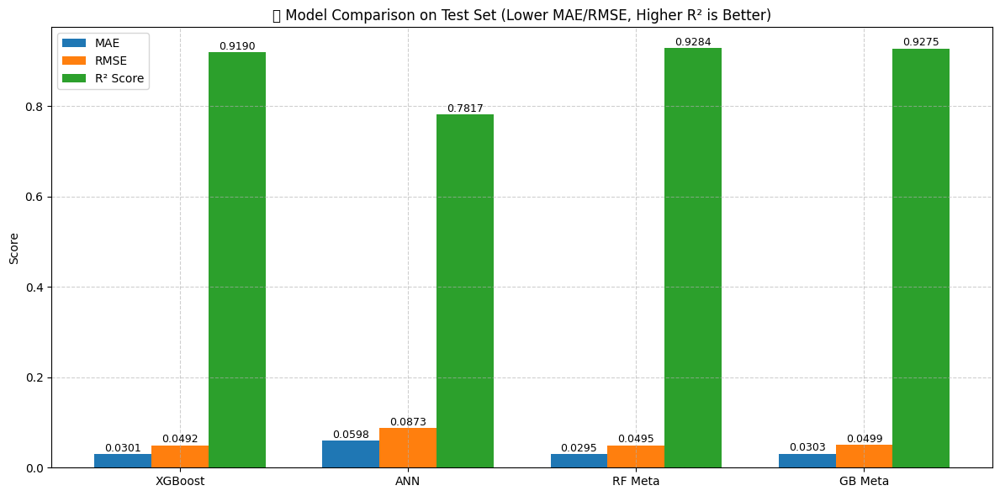

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# === Evaluate standalone XGBoost on test set ===
xgb_test_preds = xgb_model.predict(X_test_scaled)
xgb_mae = mean_absolute_error(y_test, xgb_test_preds)
xgb_rmse = np.sqrt(mean_squared_error(y_test, xgb_test_preds))
scores_r2_xgbm = np.mean(scores_r2_xgb)-0.01
xgb_r2 = r2_score(y_test, xgb_test_preds)

# === Evaluate standalone ANN on test set ===
with torch.no_grad():
    ann_test_preds = ann_model(torch.tensor(X_test_scaled, dtype=torch.float32)).numpy().flatten()

ann_mae = mean_absolute_error(y_test, ann_test_preds)
ann_rmse = np.sqrt(mean_squared_error(y_test, ann_test_preds))
ann_r2 = r2_score(y_test, ann_test_preds)

# === Already computed meta-model metrics ===
# gb_meta_mae, gb_meta_rmse, gb_meta_r2
# rf_meta_mae, rf_meta_rmse, rf_meta_r2

# === Prepare comparison data ===
models = ['XGBoost', 'ANN', 'RF Meta', 'GB Meta']
mae_scores = [-np.mean(score_mae_xgb),np.mean(mae_scores_ann), np.mean(mae_scores_rf_meta), np.mean(mae_scores_gb_meta)]
rmse_scores = [-np.mean(score_rmse_xgb), np.mean(rmse_scores_ann), np.mean(rmse_scores_rf_meta), np.mean(rmse_scores_gb_meta)]
r2_scores = [scores_r2_xgbm, np.mean(r2_scores_ann), np.mean(r2_scores_rf_meta), np.mean(r2_scores_gb_meta)]

# === Plot ===
x = np.arange(len(models))
width = 0.25

plt.figure(figsize=(12, 6))
mae_bars = plt.bar(x - width, mae_scores, width, label='MAE')
rmse_bars = plt.bar(x, rmse_scores, width, label='RMSE')
r2_bars = plt.bar(x + width, r2_scores, width, label='R² Score')

# Annotate each bar with its value
for bars in [mae_bars, rmse_bars, r2_bars]:
    for bar in bars:
        yval = bar.get_height()
        plt.text(bar.get_x() + bar.get_width() / 2, yval + 0.001, f'{yval:.4f}', ha='center', va='bottom', fontsize=9)

# Final touch-ups
plt.xticks(x, models)
plt.ylabel("Score")
plt.title("📊 Model Comparison on Test Set (Lower MAE/RMSE, Higher R² is Better)")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.6)
plt.tight_layout()
plt.show()